In [1]:
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
import maria

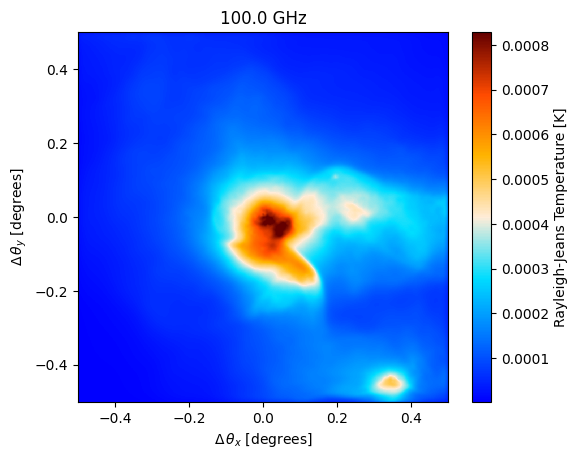

In [2]:
# MUSTANG
# map_filename = maria.io.fetch("maps/cluster.fits")
# input_map = maria.map.read_fits(filename=map_filename, #filename
#                                 resolution=-8.714e-05, #pixel size in degrees
#                                 index=0, #index for fits file
#                                 center=(150, 10), # position in the sky
#                                 units='Jy/pixel' # Units of the input map 
#                                )

# ATLAST
map_filename = maria.io.fetch("maps/big_cluster.fits")
input_map = maria.map.read_fits(filename=map_filename, 
                                width=1., #degrees
                                index=1,
                                center=(300.0, -10.0), #RA and Dec in degrees
                                units ='Jy/pixel'
                               )

input_map.to(units="K_RJ").plot()

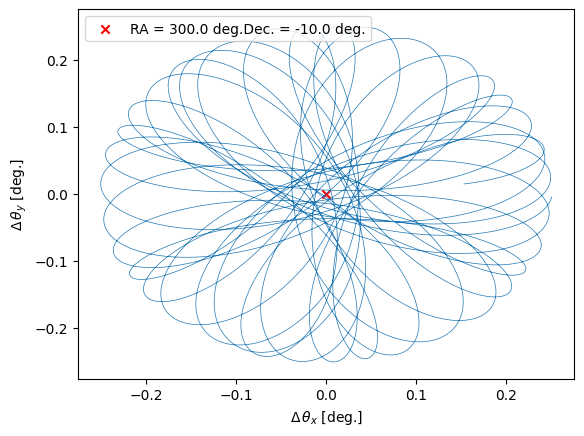

In [3]:
# MUSTANG:
# plan = maria.get_plan(scan_pattern="daisy", # scanning pattern
#                       scan_options={"radius": 0.05, "speed": 0.01}, # in degrees
#                       duration=600, # integration time in seconds
#                       sample_rate=50, # in Hz
#                       scan_center=(150, 10), # position in the sky
#                       frame="ra_dec")

# ATLAST:
plan = maria.get_plan(scan_pattern="daisy",
                      scan_options={"radius": 0.25, "speed": 0.5}, # in degrees
                      duration=60, # in seconds
                      sample_rate=225, # in Hz
                      start_time = "2022-08-10T06:00:00",
                      scan_center=(300.0, -10.0),
                      frame="ra_dec")

plan.plot()

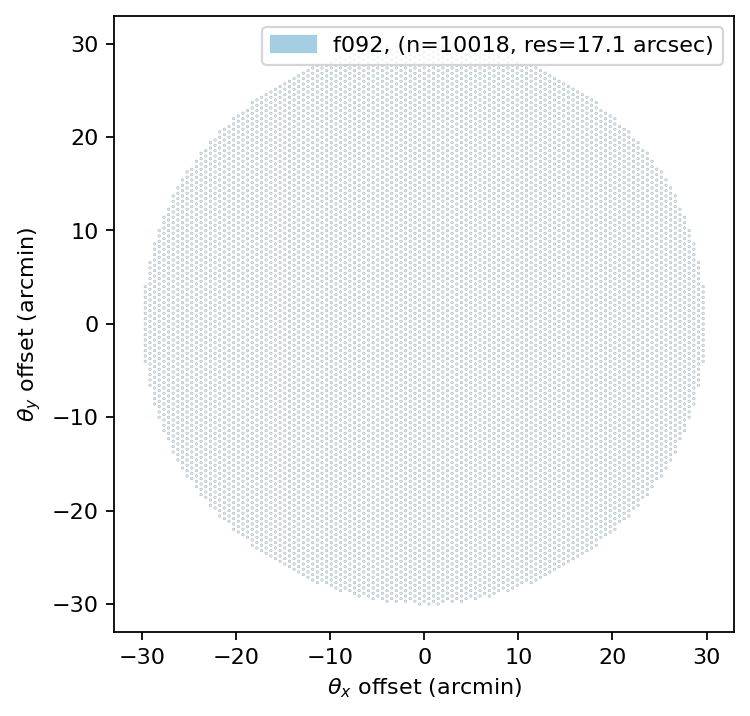

In [4]:
# MUSTANG:
# instrument = maria.get_instrument('MUSTANG-2')

#ATLAST
from maria.instrument import Band

f090 = Band(center=92, # in GHz
            width=40.0,
            knee=1,
            sensitivity=6e-5) # in K sqrt(s)

array = {"field_of_view": 1.0, "bands": [f090]}
instrument = maria.get_instrument(array=array, primary_size=50, beam_spacing = 2)

instrument.plot()

In [5]:
sim = maria.Simulation(instrument, 
                       plan=plan,
                       site="llano_de_chajnantor", 
                       map=input_map,
                       noise=False,
                       atmosphere="2d",
                       cmb="generate",
                      )

tod = sim.run()

2024-07-19 13:54:14.695 INFO: Constructed instrument.
2024-07-19 13:54:14.695 INFO: Constructed plan.
2024-07-19 13:54:14.697 INFO: Constructed site.
2024-07-19 13:54:15.438 INFO: Constructed boresight.
2024-07-19 13:54:17.308 INFO: Constructed offsets.


Initialized base in 2614 ms.


Generating CMB:   0%|          | 0/1 [00:00<?, ?it/s]2024-07-19 13:54:20.794 INFO: Sigma is 0.000000 arcmin (0.000000 rad) 
2024-07-19 13:54:20.795 INFO: -> fwhm is 0.000000 arcmin
Generating CMB: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]
Generating atmosphere: 4it [00:08,  2.02s/it]
Sampling map (f092): 100%|██████████| 1/1 [00:34<00:00, 34.86s/it]


In [6]:
# data = tod.components['atmosphere'].compute()
# data.shape
print(tod.time)
time = tod.time.compute()

data = tod.data.compute()
cmb = tod.components['cmb'].compute()
atmosphere = tod.components['atmosphere'].compute()
map = tod.components['map'].compute()
data.shape

dask.array<astype, shape=(13500,), dtype=float32, chunksize=(13500,), chunktype=numpy.ndarray>


(10018, 13500)

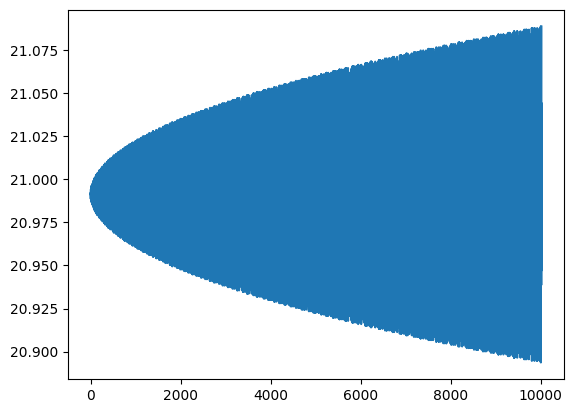

In [7]:
plt.plot(data[:,0])

In [8]:
import matplotlib as mpl
from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

# # from https://gist.github.com/zonca/6515744
# cmb_cmap = ListedColormap(
#     np.loadtxt(f"/scratch/users/jwuerzin/CMB_denoising/maria/maria/map/Planck_Parchment_RGB.txt") / 255.0, name="cmb_two"
# )
# cmb_cmap.set_bad("white")

# mpl.colormaps.register(cmb_cmap)

cmb_cmap = plt.get_cmap('cmb')
# cmb_cmap = plt.get_cmap('PRGn')

Making plot for timestep: 0


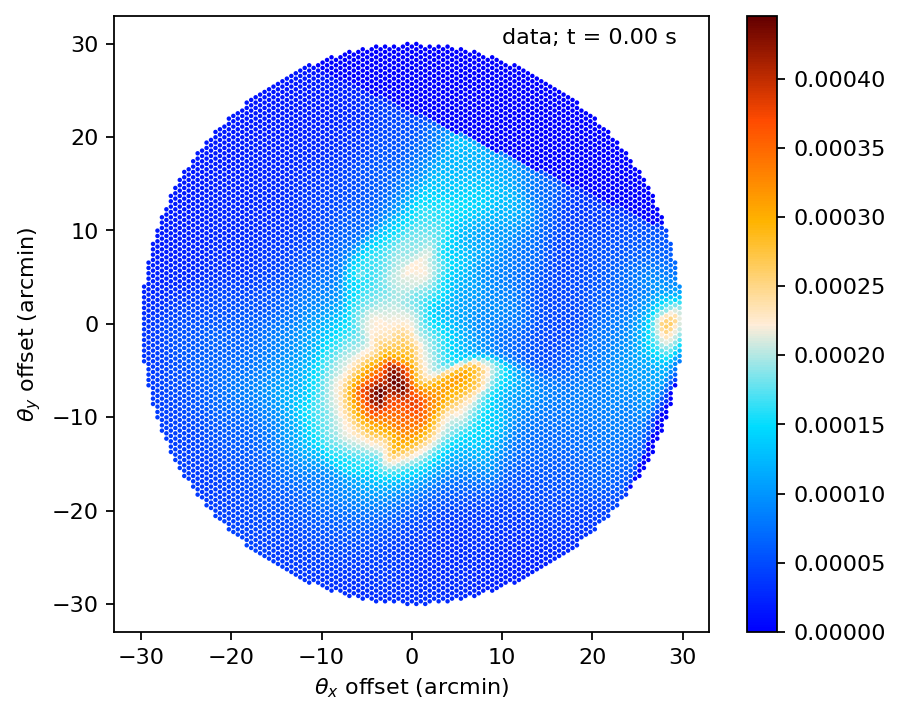

In [9]:
from matplotlib.collections import EllipseCollection
from matplotlib.patches import Patch
import matplotlib.colors as mcolors
# import matplotlib.cm as cm

from maria.tod.coords import Angle

def plot_time(instrument, data, addtext= "data", timestep=0):
        # HEX_CODE_LIST = [
        #     mpl.colors.to_hex(mpl.colormaps.get_cmap("Paired")(t))
        #     for t in [*np.linspace(0.05, 0.95, 12)]
        # ]
        print(f"Making plot for timestep: {timestep}")


        fig, ax = plt.subplots(1, 1, figsize=(6, 5), dpi=160)

        fwhms = Angle(instrument.fwhm)
        offsets = Angle(instrument.offsets)

        # legend_handles = []
        for iub, uband in enumerate(instrument.ubands):
            band_mask = instrument.dets.band_name == uband

            # band_color = HEX_CODE_LIST[iub]

            norm = mcolors.Normalize(vmin=np.min(data[:,timestep]), vmax=np.max(data[:,timestep]))
            atmos_color = cmb_cmap(norm(data[:,timestep]))

            # atmos_color = cmb_cmap(data[:,0])

            # ellipses = EllipseCollection(
            #         widths=getattr(fwhms, offsets.units)[band_mask],
            #         heights=getattr(fwhms, offsets.units)[band_mask],
            #         angles=0,
            #         units="xy",
            #         # facecolors=band_color,
            #         facecolors=atmos_color,
            #         # edgecolors="face",
            #         lw=1e-1,
            #         # alpha=0.5,
            #         offsets=getattr(offsets, offsets.units)[band_mask],
            #         transOffset=ax.transData,
            #         cmap=cmb_cmap,
            #     )

            # ax.add_collection(ellipses)

            # fig.colorbar(im, ax=ax)

            # legend_handles.append(
            #     Patch(
            #         label=f"{uband}, (n={band_mask.sum()}, "
            #         f"res={getattr(fwhms, fwhms.units)[band_mask].mean():.01f} {fwhms.units})",
            #         color=band_color,
            #     )
            # )

            # print(*getattr(offsets, offsets.units)[band_mask].T.shape)
            # print(data[:,0].shape)

            im = ax.scatter(
                *getattr(offsets, offsets.units)[band_mask].T,
                label=uband,
                # s=60, # for MUSTANG
                s=1, # for ATLAST
                c=data[:,timestep],
                cmap=cmb_cmap
            )

        fig.colorbar(im)
        ax.set_xlabel(rf"$\theta_x$ offset ({offsets.units})")
        ax.set_ylabel(rf"$\theta_y$ offset ({offsets.units})")
        # ax.legend(handles=legend_handles)

        xls, yls = ax.get_xlim(), ax.get_ylim()
        cen_x, cen_y = np.mean(xls), np.mean(yls)
        wid_x, wid_y = np.ptp(xls), np.ptp(yls)
        radius = 0.5 * np.maximum(wid_x, wid_y)

        ax.set_xlim(cen_x - radius, cen_x + radius)
        ax.set_ylim(cen_y - radius, cen_y + radius)
        
        # plt.text(1, 2., f"t = {timestep}") # For MUSTANG
        plt.text(10, 30., f"{addtext}; t = {time[timestep]:.2f} s") # For MUSTANG
        
        # plt.show()
        return fig
        
fig = plot_time(instrument, map)

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import io

# Generate and capture individual frames
# num_frames = data.shape[0]
num_frames = 1000
nskip = 10

print("num_frames", num_frames)

def makegif(dataarr, label):

    # Create a list to hold the frames
    frames = []

    for i in range(0, num_frames, nskip):
        
        fig = plot_time(instrument, dataarr, timestep=i)
        
        # Capture the plot as an image in memory
        buf = io.BytesIO()
        plt.savefig(buf, format='png')
        plt.close(fig)
        
        # Create an image from the buffer
        buf.seek(0)
        img = Image.open(buf)
        frames.append(img)

    # Save the frames as a GIF
    # frames[0].save('testgif_atmosphere.gif', save_all=True, append_images=frames[1:], duration=1, loop=0)
    frames[0].save(f'{label}.gif', save_all=True, append_images=frames[1:], duration=1, loop=0)

num_frames 1000


In [11]:
makegif(data, label="data")

Making plot for timestep: 0


Making plot for timestep: 10
Making plot for timestep: 20
Making plot for timestep: 30
Making plot for timestep: 40
Making plot for timestep: 50
Making plot for timestep: 60
Making plot for timestep: 70
Making plot for timestep: 80
Making plot for timestep: 90
Making plot for timestep: 100
Making plot for timestep: 110
Making plot for timestep: 120
Making plot for timestep: 130
Making plot for timestep: 140
Making plot for timestep: 150
Making plot for timestep: 160
Making plot for timestep: 170
Making plot for timestep: 180
Making plot for timestep: 190
Making plot for timestep: 200
Making plot for timestep: 210
Making plot for timestep: 220
Making plot for timestep: 230
Making plot for timestep: 240
Making plot for timestep: 250
Making plot for timestep: 260
Making plot for timestep: 270
Making plot for timestep: 280
Making plot for timestep: 290
Making plot for timestep: 300
Making plot for timestep: 310
Making plot for timestep: 320
Making plot for timestep: 330
Making plot for tim

In [12]:
makegif(map, label="map")

Making plot for timestep: 0
Making plot for timestep: 10
Making plot for timestep: 20
Making plot for timestep: 30
Making plot for timestep: 40
Making plot for timestep: 50
Making plot for timestep: 60
Making plot for timestep: 70
Making plot for timestep: 80
Making plot for timestep: 90
Making plot for timestep: 100
Making plot for timestep: 110
Making plot for timestep: 120
Making plot for timestep: 130
Making plot for timestep: 140
Making plot for timestep: 150
Making plot for timestep: 160
Making plot for timestep: 170
Making plot for timestep: 180
Making plot for timestep: 190
Making plot for timestep: 200
Making plot for timestep: 210
Making plot for timestep: 220
Making plot for timestep: 230
Making plot for timestep: 240
Making plot for timestep: 250
Making plot for timestep: 260
Making plot for timestep: 270
Making plot for timestep: 280
Making plot for timestep: 290
Making plot for timestep: 300
Making plot for timestep: 310
Making plot for timestep: 320
Making plot for times

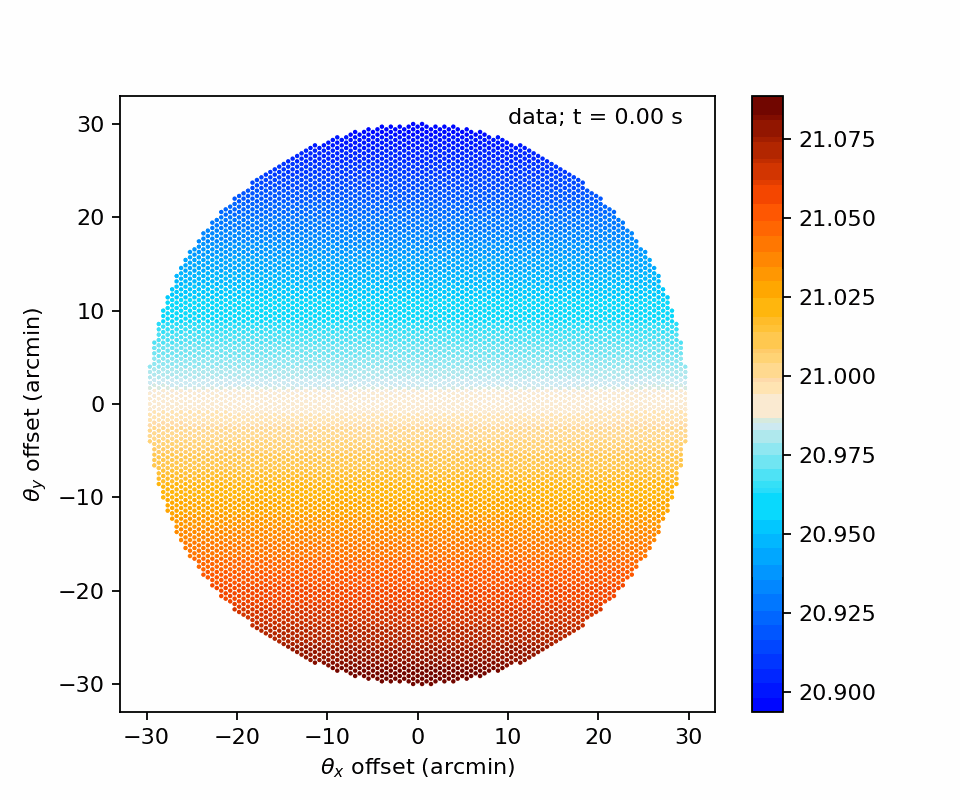

In [13]:
from IPython.display import Image as IPImage, display

display(IPImage(open('data.gif', 'rb').read()))

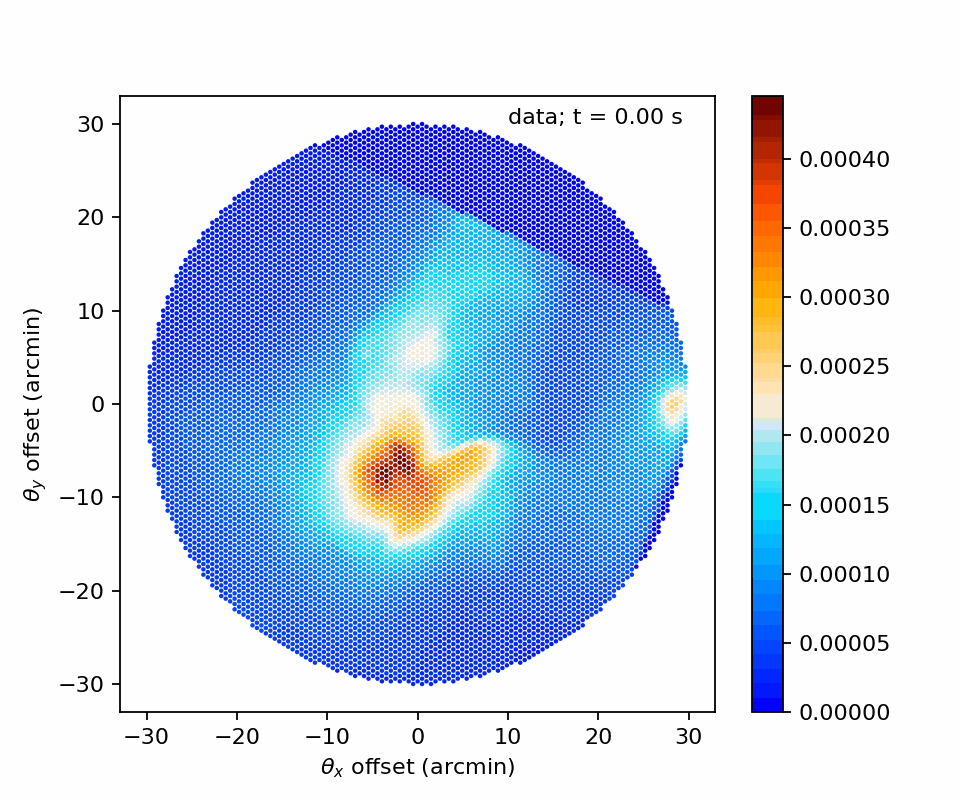

In [14]:
display(IPImage(open('map.gif', 'rb').read()))